### **1. Importando bibliotecas e a base de dados:**

In [1]:
# Importando as bibliotecas
import pandas as pd                        
import numpy as np                             
import seaborn as sns          
import matplotlib                       
import matplotlib.pyplot as plt     
import sklearn
import wordcloud                            
from wordcloud import WordCloud
import sys

In [2]:
nomes_bibliotecas = ["Pandas","Numpy","Seaborn","Matplotlib","SKlearn","WordCloud"]
bibliotecas = [pd, np, sns, matplotlib, sklearn, wordcloud]


for n,b in zip(nomes_bibliotecas, bibliotecas):
    print(f"Biblioteca: {n:<15} Versão: {b.__version__:^5}")

Biblioteca: Pandas          Versão: 2.2.2
Biblioteca: Numpy           Versão: 1.26.4
Biblioteca: Seaborn         Versão: 0.13.2
Biblioteca: Matplotlib      Versão: 3.9.0
Biblioteca: SKlearn         Versão: 1.5.0
Biblioteca: WordCloud       Versão: 1.9.3


In [3]:
# Importando a base
base = pd.read_csv('../data/base_.csv')

### **2. Criando nuvem de palavras para análises:**

In [4]:
a = base['name'].tolist()
nomes_musicas_ = ''.join(map(str, a))

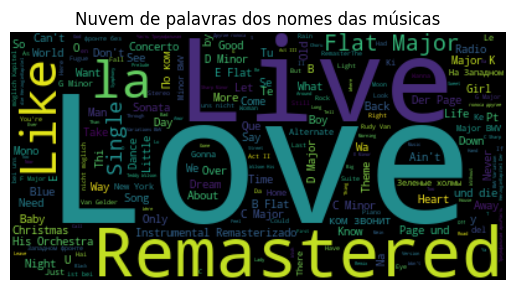

In [5]:
palavras_ocultar = ['and','or','when','why','the','he','she','it','him','her','they','are','is','am','no','me','feat','to','a','from',
                    'for','at','with','that','feat','in','my','i','op','you','up','de','all','of','one','on','will','can','be','make',
                    'do','out','not','your','go','got','get','mi',"i'm", 'el']

wordcloud_ = WordCloud(stopwords=palavras_ocultar).generate(nomes_musicas_)
plt.imshow(wordcloud_, interpolation = 'bilinear')
plt.title("Nuvem de palavras dos nomes das músicas")
plt.axis('off')
plt.savefig("../images/01_12_EDA_nuvem_nome_musicas.png")
plt.show()

### **3. Explorando a coluna de Acusticidade:**

In [6]:
base['acousticness_'] = pd.cut(base['acousticness'],
                                   bins=[-0.1, 0.25, 0.5, 0.75, 1],
                                   labels=['0-0.25','0.25-0.50','0.50-0.75','0.75-1'],
                                   right=True)

acousticness_0_025 = base.loc[base.acousticness_ == '0-0.25', "name"].to_list()
acousticness_025_050 = base.loc[base.acousticness_ == '0.25-0.50', "name"].to_list()
acousticness_050_75 = base.loc[base.acousticness_ == '0.50-0.75', "name"].to_list()
acousticness_075_1 = base.loc[base.acousticness_ == '0.75-1', "name"].to_list()

acousticness_0_025 = ''.join(map(str, acousticness_0_025))
acousticness_025_050 = ''.join(map(str, acousticness_025_050))
acousticness_050_75 = ''.join(map(str, acousticness_050_75))
acousticness_075_1 = ''.join(map(str, acousticness_075_1))

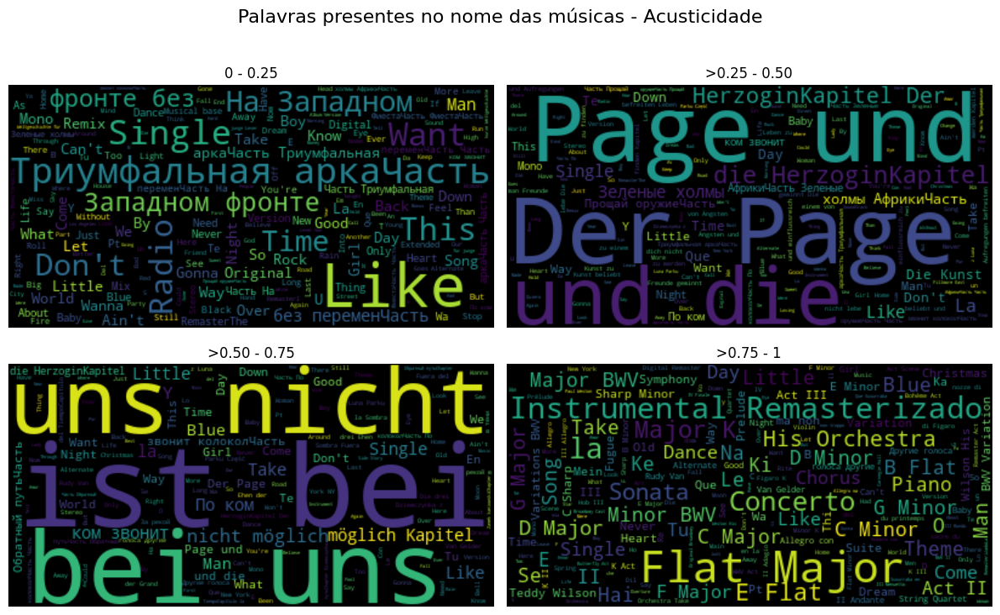

In [7]:
fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(12,8), tight_layout=True)

lista_nuvens = [acousticness_0_025, acousticness_025_050, acousticness_050_75, acousticness_075_1]

titulos = ["0 - 0.25", ">0.25 - 0.50", ">0.50 - 0.75", ">0.75 - 1"]

palavras_ocultar = ['and','or','when','why','the','he','she','it','him','her','they','are','is','am','no','me',
                    'feat','to','a','from','for','at','with','that','feat','in','my','i','op','you','up','de',
                    'all','of','one','on','will','can','be','make','do','out','not','your','go','got','get','mi',
                    "i'm", 'el','love','live','remastered']

for i, a, t in zip(lista_nuvens, ax.flat, titulos):
    wordcloud = WordCloud(stopwords=palavras_ocultar).generate(i)
    a.imshow(wordcloud, interpolation = 'bilinear')
    a.axis('off')
    a.set_title(t, fontsize=12)
plt.suptitle("Palavras presentes no nome das músicas - Acusticidade", fontsize=16)
plt.savefig("../images/01_13_EDA_acusticidade.png")
plt.show()

### **4. Explorando a coluna "Explicit":**

In [8]:
base.explicit.value_counts().index

Index([0, 1], dtype='int64', name='explicit')

In [9]:
explicit_0 = base.loc[base.explicit == 0, "name"].to_list()
explicit_1 = base.loc[base.explicit == 1, "name"].to_list()

explicit_0 = ''.join(map(str, explicit_0))
explicit_1 = ''.join(map(str, explicit_1))

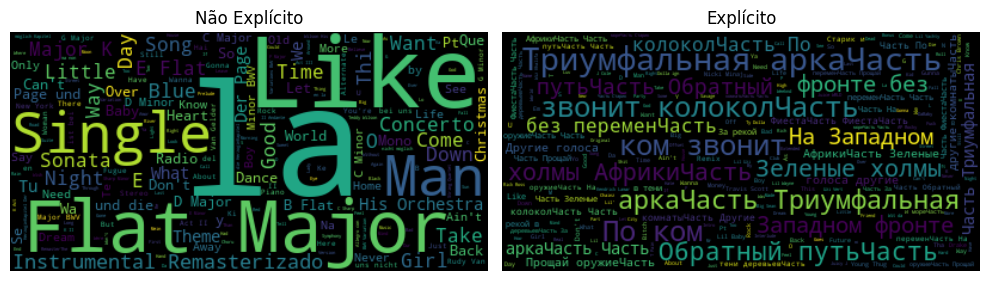

In [10]:
fig, ax = plt.subplots(ncols=2, figsize=(10,4), tight_layout=True)

lista_nuvens = [explicit_0, explicit_1]

titulos = ["Não Explícito", "Explícito"]

palavras_ocultar = ['and','or','when','why','the','he','she','it','him','her','they','are','is','am','no','me',
                    'feat','to','a','from','for','at','with','that','feat','in','my','i','op','you','up','de',
                    'all','of','one','on','will','can','be','make','do','out','not','your','go','got','get','mi',
                    "i'm", 'el','love','live','remastered']

for i, a, t in zip(lista_nuvens, ax.flat, titulos):
    wordcloud = WordCloud(stopwords=palavras_ocultar).generate(i)
    a.imshow(wordcloud, interpolation = 'bilinear')
    a.axis('off')
    a.set_title(t, fontsize=12)
    
plt.savefig("../images/01_14_EDA_explicit.png")
plt.show()

### **5. Instrumentalidade:**

In [11]:
base.instrumentalness.value_counts().index

Index([     0.0,    0.916,    0.917,    0.904,    0.922,    0.913,    0.899,
          0.909,    0.903,    0.914,
       ...
        0.00854, 0.000959, 0.000981,  0.00994, 8.05e-06,  0.00864, 0.000772,
        0.00917,  0.00911, 0.000908],
      dtype='float64', name='instrumentalness', length=5401)

In [12]:
base['instrumentalness_'] = pd.cut(base['instrumentalness'],
                                   bins=[-0.1, 0.25, 0.5, 0.75, 1],
                                   labels=['0-0.25','0.25-0.50','0.50-0.75','0.75-1'],
                                   right=True)

instrumentalness_0_025 = base.loc[base.instrumentalness_ == '0-0.25', "name"].to_list()
instrumentalness_025_050 = base.loc[base.instrumentalness_ == '0.25-0.50', "name"].to_list()
instrumentalness_050_75 = base.loc[base.instrumentalness_ == '0.50-0.75', "name"].to_list()
instrumentalness_075_1 = base.loc[base.instrumentalness_ == '0.75-1', "name"].to_list()

instrumentalness_0_025 = ''.join(map(str, instrumentalness_0_025))
instrumentalness_025_050 = ''.join(map(str, instrumentalness_025_050))
instrumentalness_050_75 = ''.join(map(str, instrumentalness_050_75))
instrumentalness_075_1 = ''.join(map(str, instrumentalness_075_1))

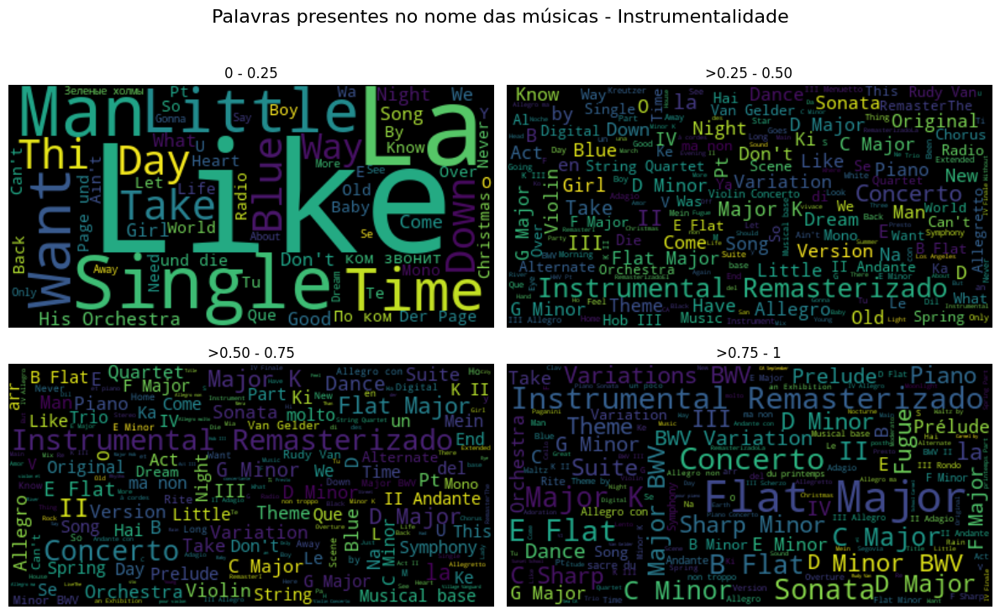

In [13]:
fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(12,8), tight_layout=True)

lista_nuvens = [instrumentalness_0_025, instrumentalness_025_050, instrumentalness_050_75, instrumentalness_075_1]

titulos = ["0 - 0.25", ">0.25 - 0.50", ">0.50 - 0.75", ">0.75 - 1"]

palavras_ocultar = ['and','or','when','why','the','he','she','it','him','her','they','are','is','am','no','me',
                    'feat','to','a','from','for','at','with','that','feat','in','my','i','op','you','up','de',
                    'all','of','one','on','will','can','be','make','do','out','not','your','go','got','get','mi',
                    "i'm", 'el','love','live','remastered']

for i, a, t in zip(lista_nuvens, ax.flat, titulos):
    wordcloud = WordCloud(stopwords=palavras_ocultar).generate(i)
    a.imshow(wordcloud, interpolation = 'bilinear')
    a.axis('off')
    a.set_title(t, fontsize=12)
plt.suptitle("Palavras presentes no nome das músicas - Instrumentalidade", fontsize=16)
plt.savefig("../images/01_15_EDA_instrumentalidade.png")
plt.show()

### **6. Energia**

In [14]:
base['energy_'] = pd.cut(base['energy'],
                                   bins=[-0.1, 0.25, 0.5, 0.75, 1],
                                   labels=['0-0.25','0.25-0.50','0.50-0.75','0.75-1'],
                                   right=True)

energy_0_025 = base.loc[base.energy_ == '0-0.25', "name"].to_list()
energy_025_050 = base.loc[base.energy_ == '0.25-0.50', "name"].to_list()
energy_050_75 = base.loc[base.energy_ == '0.50-0.75', "name"].to_list()
energy_075_1 = base.loc[base.energy_ == '0.75-1', "name"].to_list()

energy_0_025 = ''.join(map(str, energy_0_025))
energy_025_050 = ''.join(map(str, energy_025_050))
energy_050_75 = ''.join(map(str, energy_050_75))
energy_075_1 = ''.join(map(str, energy_075_1))

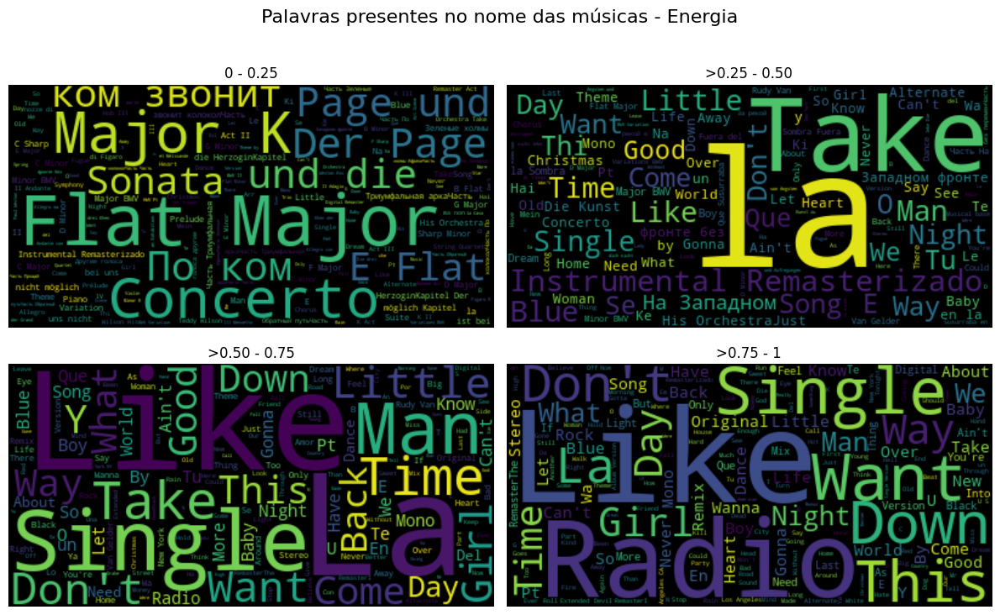

In [15]:
fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(12,8), tight_layout=True)

lista_nuvens = [energy_0_025, energy_025_050, energy_050_75, energy_075_1]

titulos = ["0 - 0.25", ">0.25 - 0.50", ">0.50 - 0.75", ">0.75 - 1"]

palavras_ocultar = ['and','or','when','why','the','he','she','it','him','her','they','are','is','am','no','me',
                    'feat','to','a','from','for','at','with','that','feat','in','my','i','op','you','up','de',
                    'all','of','one','on','will','can','be','make','do','out','not','your','go','got','get','mi',
                    "i'm", 'el','love','live','remastered']

for i, a, t in zip(lista_nuvens, ax.flat, titulos):
    wordcloud = WordCloud(stopwords=palavras_ocultar).generate(i)
    a.imshow(wordcloud, interpolation = 'bilinear')
    a.axis('off')
    a.set_title(t, fontsize=12)
plt.suptitle("Palavras presentes no nome das músicas - Energia", fontsize=16)
plt.savefig("../images/01_16_EDA_energia.png")
plt.show()

### **7. Volume (dB):**

In [16]:
print(base.loudness.min())
print(base.loudness.max())

-60.0
3.855


In [17]:
base.loudness.describe()

count    170110.000000
mean        -11.444822
std           5.677984
min         -60.000000
25%         -14.581750
50%         -10.563000
75%          -7.177000
max           3.855000
Name: loudness, dtype: float64

In [18]:
base['loudness_'] = pd.cut(base['loudness'],
                                   bins=[-60.1, -40, -20, base.loudness.max()],
                                   labels=['-60 a -40','> -40 a -20','> -20 a máx'],
                                   right=True)

loudness_60_40 = base.loc[base.loudness_ == '-60 a -40', "name"].to_list()
loudness_40_20 = base.loc[base.loudness_ == '> -40 a -20', "name"].to_list()
loudness_20_m = base.loc[base.loudness_ == '> -20 a máx', "name"].to_list()

loudness_60_40 = ''.join(map(str, loudness_60_40))
loudness_40_20 = ''.join(map(str, loudness_40_20))
loudness_20_m = ''.join(map(str, loudness_20_m))

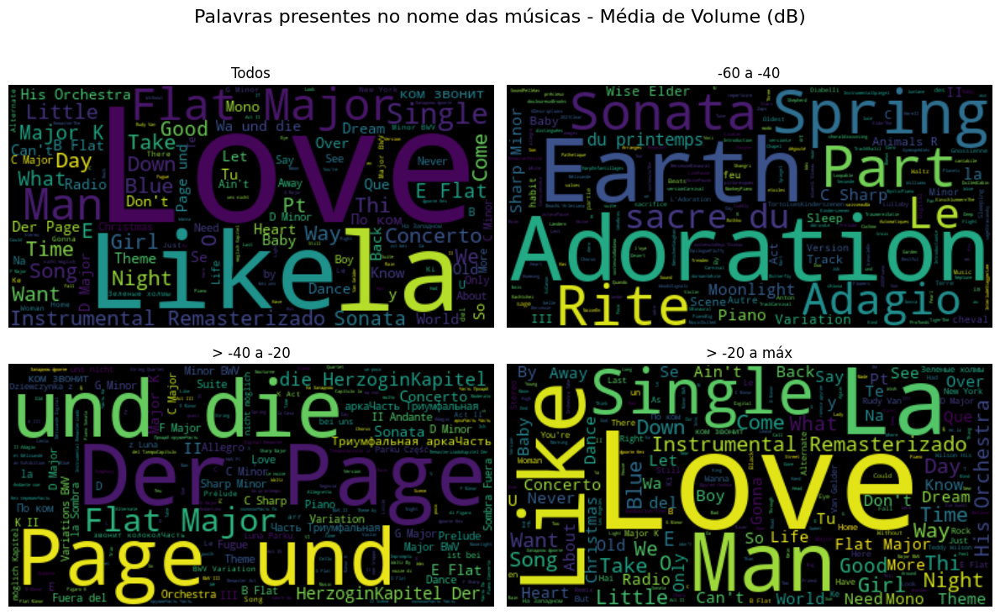

In [19]:
fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(12,8), tight_layout=True)

lista_nuvens = [nomes_musicas_, loudness_60_40, loudness_40_20, loudness_20_m]

titulos = ["Todos", "-60 a -40", "> -40 a -20", "> -20 a máx"]

palavras_ocultar = ['and','or','when','why','the','he','she','it','him','her','they','are','is','am','no','me',
                    'feat','to','a','from','for','at','with','that','feat','in','my','i','op','you','up','de',
                    'all','of','one','on','will','can','be','make','do','out','not','your','go','got','get','mi',
                    "i'm", 'el','live','remastered']

for i, a, t in zip(lista_nuvens, ax.flat, titulos):
    wordcloud = WordCloud(stopwords=palavras_ocultar).generate(i)
    a.imshow(wordcloud, interpolation = 'bilinear')
    a.axis('off')
    a.set_title(t, fontsize=12)
plt.suptitle("Palavras presentes no nome das músicas - Média de Volume (dB)", fontsize=16)
plt.savefig("../images/01_17_EDA_loudness.png")
plt.show()

### **8. Público no áudio**

In [20]:
base.columns

Index(['name', 'year', 'duration_ms', 'key', 'tempo', 'mode', 'explicit',
       'acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'valence', 'year_', 'valence_',
       'acousticness_', 'tempo_', 'instrumentalness_', 'energy_', 'loudness_'],
      dtype='object')

In [21]:
base['liveness_'] = pd.cut(base['liveness'],
                                   bins=[-0.1, 0.25, 0.5, 0.75, 1],
                                   labels=['0-0.25','0.25-0.50','0.50-0.75','0.75-1'],
                                   right=True)

liveness_0_025 = base.loc[base.liveness_ == '0-0.25', "name"].to_list()
liveness_025_050 = base.loc[base.liveness_ == '0.25-0.50', "name"].to_list()
liveness_050_75 = base.loc[base.liveness_ == '0.50-0.75', "name"].to_list()
liveness_075_1 = base.loc[base.liveness_ == '0.75-1', "name"].to_list()

liveness_0_025 = ''.join(map(str, liveness_0_025))
liveness_025_050 = ''.join(map(str, liveness_025_050))
liveness_050_75 = ''.join(map(str, liveness_050_75))
liveness_075_1 = ''.join(map(str, liveness_075_1))

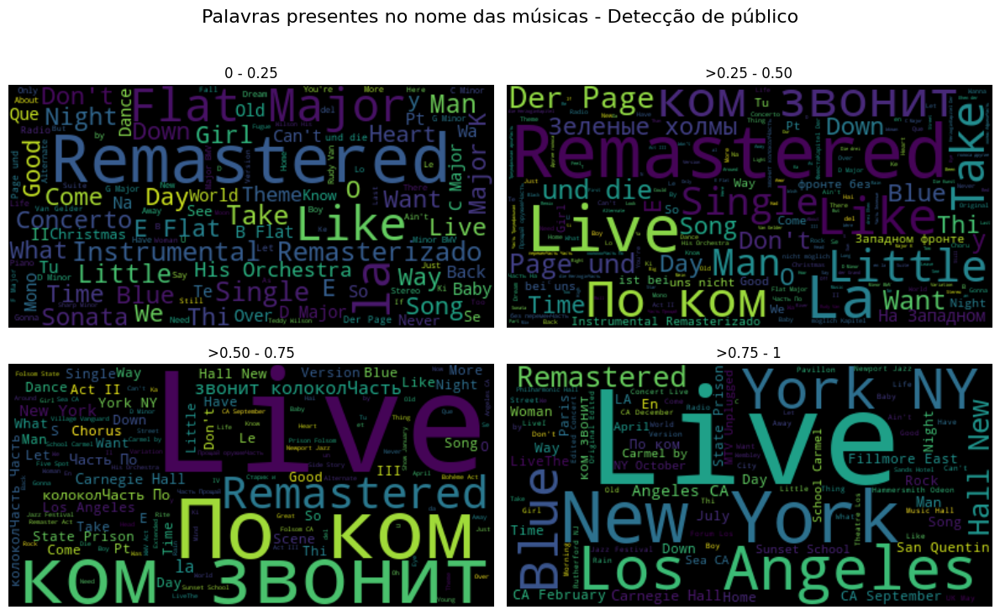

In [22]:
fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(12,8), tight_layout=True)

lista_nuvens = [liveness_0_025, liveness_025_050, liveness_050_75, liveness_075_1]

titulos = ["0 - 0.25", ">0.25 - 0.50", ">0.50 - 0.75", ">0.75 - 1"]

palavras_ocultar = ['and','or','when','why','the','he','she','it','him','her','they','are','is','am','no','me',
                    'feat','to','a','from','for','at','with','that','feat','in','my','i','op','you','up','de',
                    'all','of','one','on','will','can','be','make','do','out','not','your','go','got','get','mi',
                    "i'm", 'el','love']

for i, a, t in zip(lista_nuvens, ax.flat, titulos):
    wordcloud = WordCloud(stopwords=palavras_ocultar).generate(i)
    a.imshow(wordcloud, interpolation = 'bilinear')
    a.axis('off')
    a.set_title(t, fontsize=12)
plt.suptitle("Palavras presentes no nome das músicas - Detecção de público", fontsize=16)
plt.savefig("../images/01_18_EDA_liveness.png")
plt.show()

### **9. Valência musical**

In [23]:
base['valence_'] = pd.cut(base['valence'],
                                   bins=[-0.1, 0.25, 0.5, 0.75, 1],
                                   labels=['0-0.25','0.25-0.50','0.50-0.75','0.75-1'],
                                   right=True)

valence_0_025 = base.loc[base.valence_ == '0-0.25', "name"].to_list()
valence_025_050 = base.loc[base.valence_ == '0.25-0.50', "name"].to_list()
valence_050_75 = base.loc[base.valence_ == '0.50-0.75', "name"].to_list()
valence_075_1 = base.loc[base.valence_ == '0.75-1', "name"].to_list()

valence_0_025 = ''.join(map(str, valence_0_025))
valence_025_050 = ''.join(map(str, valence_025_050))
valence_050_75 = ''.join(map(str, valence_050_75))
valence_075_1 = ''.join(map(str, valence_075_1))

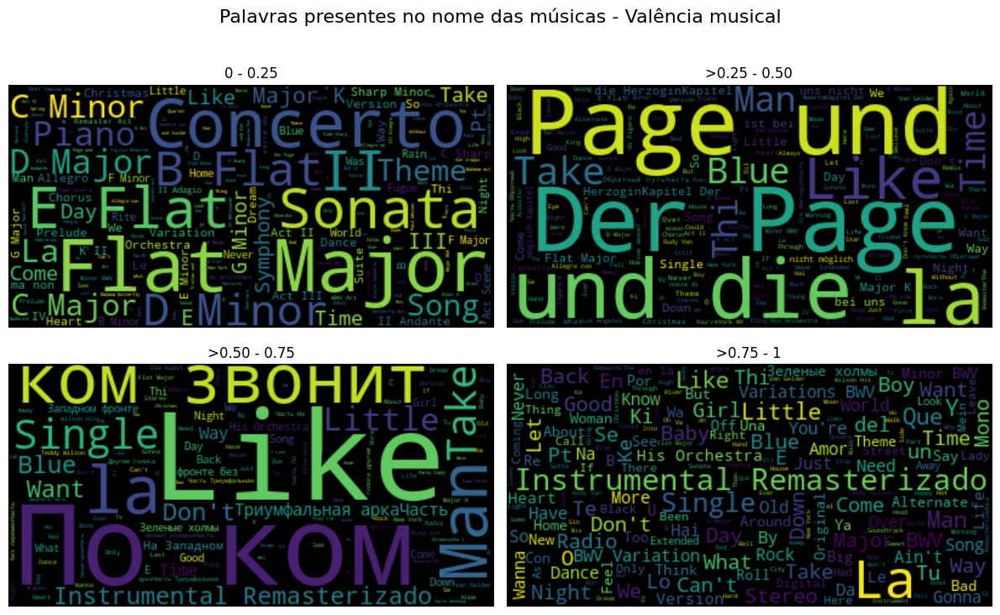

In [24]:
fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(12,8), tight_layout=True)

lista_nuvens = [valence_0_025, valence_025_050, valence_050_75, valence_075_1]

titulos = ["0 - 0.25", ">0.25 - 0.50", ">0.50 - 0.75", ">0.75 - 1"]

palavras_ocultar = ['and','or','when','why','the','he','she','it','him','her','they','are','is','am','no','me',
                    'feat','to','a','from','for','at','with','that','feat','in','my','i','op','you','up','de',
                    'all','of','one','on','will','can','be','make','do','out','not','your','go','got','get','mi',
                    "i'm", 'el','love','live','remastered']

for i, a, t in zip(lista_nuvens, ax.flat, titulos):
    wordcloud = WordCloud(stopwords=palavras_ocultar).generate(i)
    a.imshow(wordcloud, interpolation = 'bilinear')
    a.axis('off')
    a.set_title(t, fontsize=12)
plt.suptitle("Palavras presentes no nome das músicas - Valência musical", fontsize=16)
plt.savefig("../images/01_19_EDA_valence.png")
plt.show()

### **10. Key**

In [25]:
base.key.value_counts().sort_index()

key
0     21534
1     12852
2     18757
3      7261
4     12900
5     16379
6      8712
7     20742
8     10718
9     17534
10    12085
11    10636
Name: count, dtype: int64

In [26]:
key_0 = base.loc[base.key == 0, "name"].to_list()
key_1 = base.loc[base.key == 1, "name"].to_list()
key_2 = base.loc[base.key == 2, "name"].to_list()
key_3 = base.loc[base.key == 3, "name"].to_list()
key_4 = base.loc[base.key == 4, "name"].to_list()
key_5 = base.loc[base.key == 5, "name"].to_list()
key_6 = base.loc[base.key == 6, "name"].to_list()
key_7 = base.loc[base.key == 7, "name"].to_list()
key_8 = base.loc[base.key == 8, "name"].to_list()
key_9 = base.loc[base.key == 9, "name"].to_list()
key_10 = base.loc[base.key == 10, "name"].to_list()
key_11 = base.loc[base.key == 11, "name"].to_list()

key_0 = ''.join(map(str, key_0))
key_1 = ''.join(map(str, key_1))
key_2 = ''.join(map(str, key_2))
key_3 = ''.join(map(str, key_3))
key_4 = ''.join(map(str, key_4))
key_5 = ''.join(map(str, key_5))
key_6 = ''.join(map(str, key_6))
key_7 = ''.join(map(str, key_7))
key_8 = ''.join(map(str, key_8))
key_9 = ''.join(map(str, key_9))
key_10 = ''.join(map(str, key_10))
key_11 = ''.join(map(str, key_11))

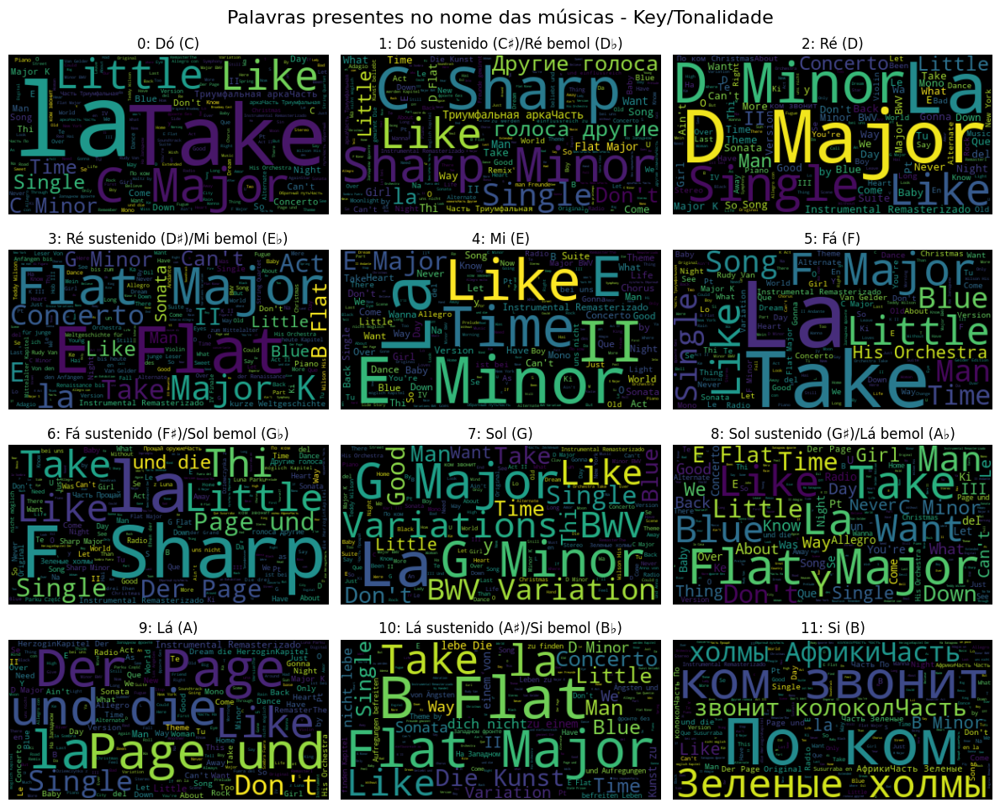

In [27]:
fig, ax = plt.subplots(ncols=3, nrows=4, figsize=(12,10), tight_layout=True)

lista_nuvens = [key_0, key_1, key_2, key_3, key_4, key_5, key_6, 
                key_7, key_8, key_9, key_10, key_11]

titulos = ['0: Dó (C)','1: Dó sustenido (C♯)/Ré bemol (D♭)','2: Ré (D)','3: Ré sustenido (D♯)/Mi bemol (E♭)',
           '4: Mi (E)','5: Fá (F)','6: Fá sustenido (F♯)/Sol bemol (G♭)','7: Sol (G)',
           '8: Sol sustenido (G♯)/Lá bemol (A♭)','9: Lá (A)','10: Lá sustenido (A♯)/Si bemol (B♭)','11: Si (B)']

palavras_ocultar = ['and','or','when','why','the','he','she','it','him','her','they','are','is','am','no','me',
                    'feat','to','a','from','for','at','with','that','feat','in','my','i','op','you','up','de',
                    'all','of','one','on','will','can','be','make','do','out','not','your','go','got','get','mi',
                    "i'm", 'el','live','remastered','love']

for i, a, t in zip(lista_nuvens, ax.flat, titulos):
    wordcloud = WordCloud(stopwords=palavras_ocultar).generate(i)
    a.imshow(wordcloud, interpolation = 'bilinear')
    a.axis('off')
    a.set_title(t, fontsize=12)
plt.suptitle("Palavras presentes no nome das músicas - Key/Tonalidade", fontsize=16)
plt.savefig("../images/01_20_EDA_keys.png")
plt.show()

### **11. Mode**

In [28]:
base['mode'].value_counts()

mode
1    120268
0     49842
Name: count, dtype: int64

In [29]:
mode_0 = base.loc[base['mode'] == 0, "name"].to_list()
mode_1 = base.loc[base['mode'] == 1, "name"].to_list()

mode_0 = ''.join(map(str, mode_0))
mode_1 = ''.join(map(str, mode_1))

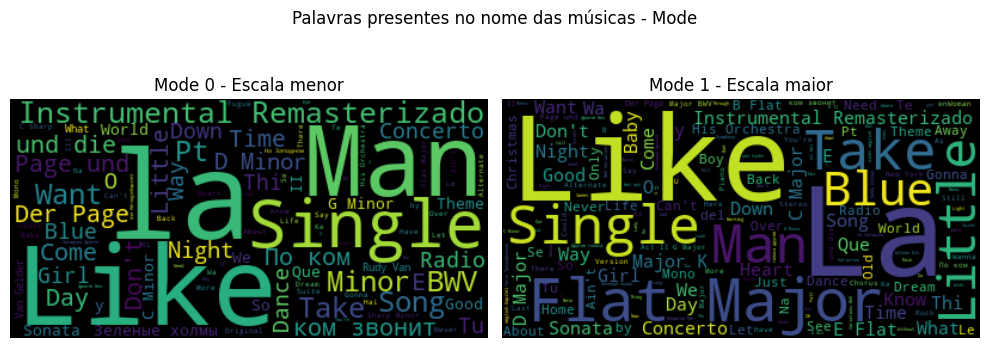

In [31]:
fig, ax = plt.subplots(ncols=2, figsize=(10,4), tight_layout=True)

lista_nuvens = [mode_0, mode_1]

titulos = ["Mode 0 - Escala menor", "Mode 1 - Escala maior"]

palavras_ocultar = ['and','or','when','why','the','he','she','it','him','her','they','are','is','am','no','me',
                    'feat','to','a','from','for','at','with','that','feat','in','my','i','op','you','up','de',
                    'all','of','one','on','will','can','be','make','do','out','not','your','go','got','get','mi',
                    "i'm", 'el','love','live','remastered']

for i, a, t in zip(lista_nuvens, ax.flat, titulos):
    wordcloud = WordCloud(stopwords=palavras_ocultar).generate(i)
    a.imshow(wordcloud, interpolation = 'bilinear')
    a.axis('off')
    a.set_title(t, fontsize=12)
plt.savefig("../images/01_21_EDA_mode.png")
plt.suptitle("Palavras presentes no nome das músicas - Mode")
plt.show()

### **12. Dançabilidade**

In [32]:
base['danceability_'] = pd.cut(base['danceability'],
                                   bins=[-0.1, 0.25, 0.5, 0.75, 1],
                                   labels=['0-0.25','0.25-0.50','0.50-0.75','0.75-1'],
                                   right=True)

danceability_0_025 = base.loc[base.danceability_ == '0-0.25', "name"].to_list()
danceability_025_050 = base.loc[base.danceability_ == '0.25-0.50', "name"].to_list()
danceability_050_75 = base.loc[base.danceability_ == '0.50-0.75', "name"].to_list()
danceability_075_1 = base.loc[base.danceability_ == '0.75-1', "name"].to_list()

danceability_0_025 = ''.join(map(str, danceability_0_025))
danceability_025_050 = ''.join(map(str, danceability_025_050))
danceability_050_75 = ''.join(map(str, danceability_050_75))
danceability_075_1 = ''.join(map(str, danceability_075_1))

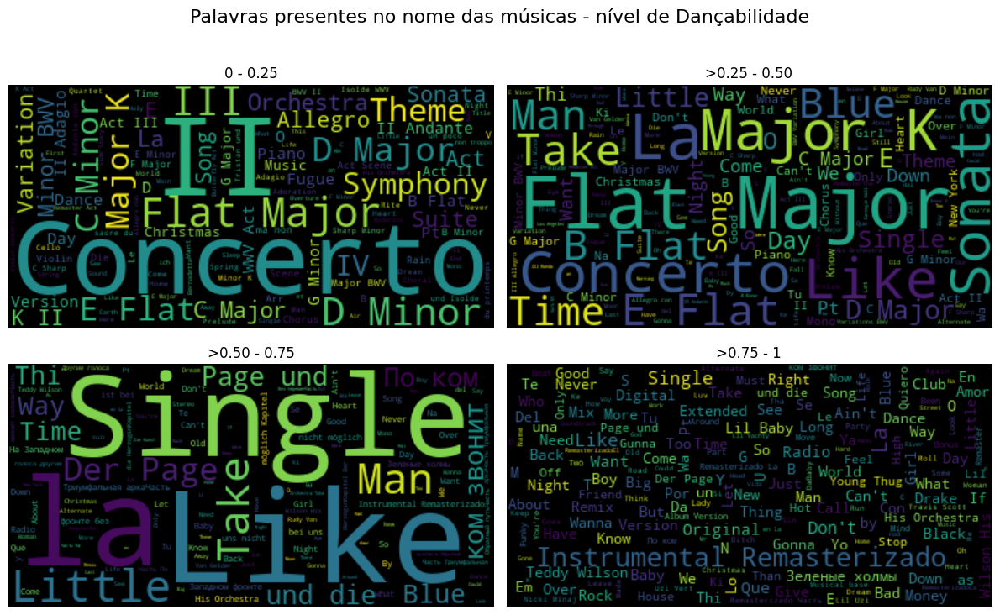

In [33]:
fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(12,8), tight_layout=True)

lista_nuvens = [danceability_0_025, danceability_025_050, danceability_050_75, danceability_075_1]

titulos = ["0 - 0.25", ">0.25 - 0.50", ">0.50 - 0.75", ">0.75 - 1"]

palavras_ocultar = ['and','or','when','why','the','he','she','it','him','her','they','are','is','am','no','me',
                    'feat','to','a','from','for','at','with','that','feat','in','my','i','op','you','up','de',
                    'all','of','one','on','will','can','be','make','do','out','not','your','go','got','get','mi',
                    "i'm", 'el','love','live','remastered']

for i, a, t in zip(lista_nuvens, ax.flat, titulos):
    wordcloud = WordCloud(stopwords=palavras_ocultar).generate(i)
    a.imshow(wordcloud, interpolation = 'bilinear')
    a.axis('off')
    a.set_title(t, fontsize=12)
plt.suptitle("Palavras presentes no nome das músicas - nível de Dançabilidade", fontsize=16)
plt.savefig("../images/01_22_EDA_dancabilidade.png")
plt.show()

### **13. Tempo**

In [34]:
base.tempo.describe()

count    170110.000000
mean        116.895498
std          30.697529
min           0.000000
25%          93.478000
50%         114.772500
75%         135.566750
max         243.507000
Name: tempo, dtype: float64

(array([1.4300e+02, 1.6700e+02, 7.1230e+03, 4.3764e+04, 4.8939e+04,
        4.2185e+04, 1.6365e+04, 9.5830e+03, 1.8260e+03, 1.5000e+01]),
 array([  0.    ,  24.3507,  48.7014,  73.0521,  97.4028, 121.7535,
        146.1042, 170.4549, 194.8056, 219.1563, 243.507 ]),
 <BarContainer object of 10 artists>)

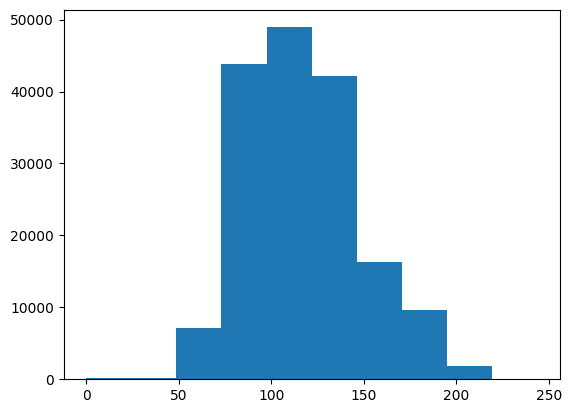

In [35]:
plt.hist(base.tempo)

In [36]:
base['tempo_'] = pd.cut(base['tempo'],
                                   bins=[base.tempo.min(), 80, 120, 160, base.tempo.max()],
                                   labels=['Até 80 BPM','>80-120 BPM','>120-160 BPM','>160 BPM'],
                                   right=True)

tempo_80 = base.loc[base.tempo_ == 'Até 80 BPM', "name"].to_list()
tempo_80_120 = base.loc[base.tempo_ == '>80-120 BPM', "name"].to_list()
tempo_120_160 = base.loc[base.tempo_ == '>120-160 BPM', "name"].to_list()
tempo_160_ = base.loc[base.tempo_ == '>160 BPM', "name"].to_list()

tempo_80 = ''.join(map(str, tempo_80))
tempo_80_120 = ''.join(map(str, tempo_80_120))
tempo_120_160 = ''.join(map(str, tempo_120_160))
tempo_160_ = ''.join(map(str, tempo_160_))

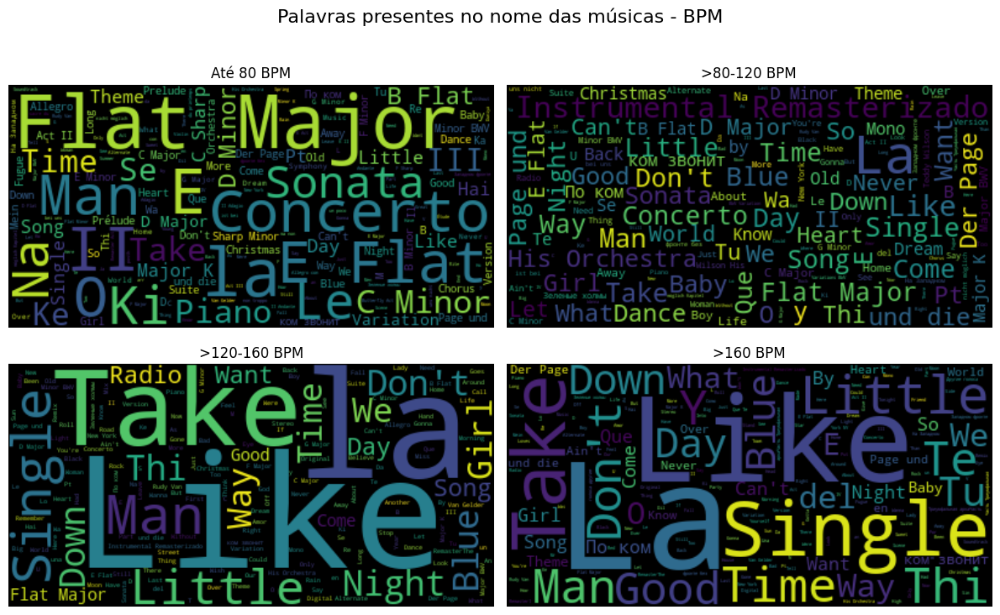

In [37]:
fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(12,8), tight_layout=True)

lista_nuvens = [tempo_80, tempo_80_120, tempo_120_160, tempo_160_]

titulos = ["Até 80 BPM", ">80-120 BPM", ">120-160 BPM", ">160 BPM"]

palavras_ocultar = ['and','or','when','why','the','he','she','it','him','her','they','are','is','am','no','me',
                    'feat','to','a','from','for','at','with','that','feat','in','my','i','op','you','up','de',
                    'all','of','one','on','will','can','be','make','do','out','not','your','go','got','get','mi',
                    "i'm", 'el','remastered','love','live']

for i, a, t in zip(lista_nuvens, ax.flat, titulos):
    wordcloud = WordCloud(stopwords=palavras_ocultar).generate(i)
    a.imshow(wordcloud, interpolation = 'bilinear')
    a.axis('off')
    a.set_title(t, fontsize=12)
plt.suptitle("Palavras presentes no nome das músicas - BPM", fontsize=16)
plt.savefig("../images/01_23_EDA_tempo.png")
plt.show()

### **14. Ano de Lançamento**

In [38]:
base.year_.value_counts().sort_index()

year_
1920-1929     4990
1930-1939     9545
1940-1949    15073
1950-1959    19808
1960-1969    19549
1970-1979    19994
1980-1989    19845
1990-1999    19897
2000-2009    19644
2010+        21765
Name: count, dtype: int64

In [39]:
year_1920_1929 = base.loc[base.year_ == '1920-1929', "name"].to_list()
year_1930_1939 = base.loc[base.year_ == '1930-1939', "name"].to_list()
year_1940_1949 = base.loc[base.year_ == '1940-1949', "name"].to_list()
year_1950_1959 = base.loc[base.year_ == '1950-1959', "name"].to_list()
year_1960_1969 = base.loc[base.year_ == '1960-1969', "name"].to_list()
year_1970_1979 = base.loc[base.year_ == '1970-1979', "name"].to_list()
year_1980_1989 = base.loc[base.year_ == '1980-1989', "name"].to_list()
year_1990_1999 = base.loc[base.year_ == '1990-1999', "name"].to_list()
year_2000_2009 = base.loc[base.year_ == '2000-2009', "name"].to_list()
year_2010_ = base.loc[base.year_ == '2010+', "name"].to_list()


year_1920_1929 = ''.join(map(str, year_1920_1929))
year_1930_1939 = ''.join(map(str, year_1930_1939))
year_1940_1949 = ''.join(map(str, year_1940_1949))
year_1950_1959 = ''.join(map(str, year_1950_1959))
year_1960_1969 = ''.join(map(str, year_1960_1969))
year_1970_1979 = ''.join(map(str, year_1970_1979))
year_1980_1989 = ''.join(map(str, year_1980_1989))
year_1990_1999 = ''.join(map(str, year_1990_1999))
year_2000_2009 = ''.join(map(str, year_2000_2009))
year_2010_ = ''.join(map(str, year_2010_))

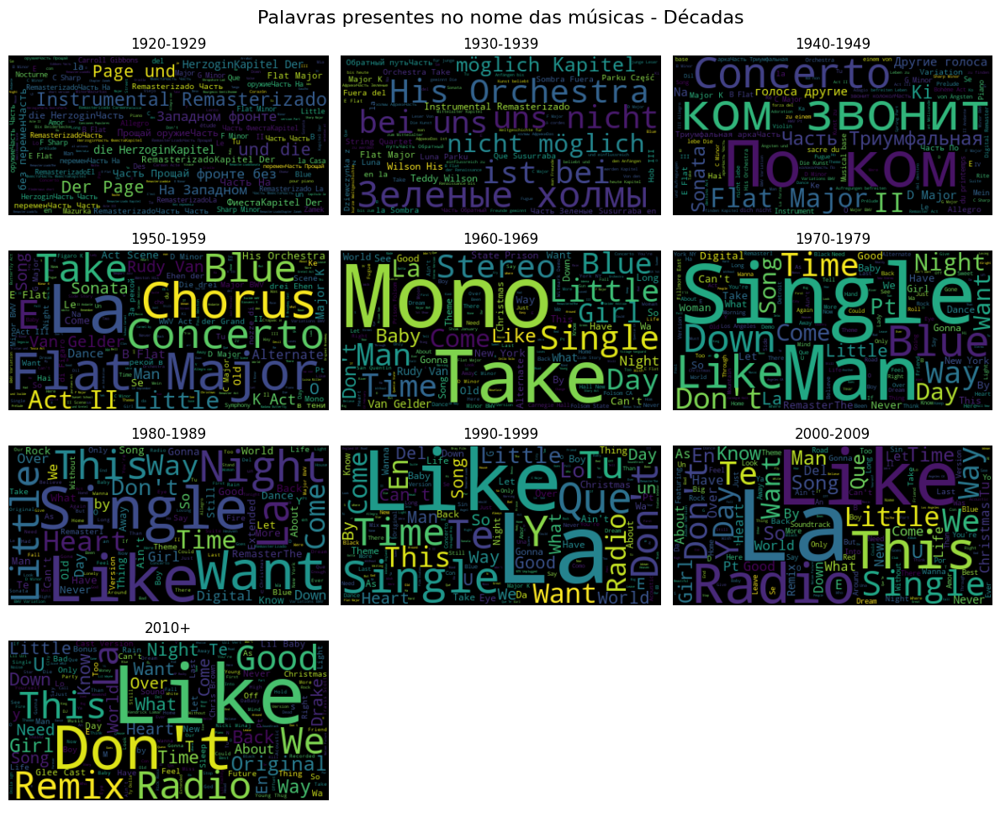

In [40]:
fig, ax = plt.subplots(ncols=3, nrows=4, figsize=(12,10), tight_layout=True)

lista_nuvens = [year_1920_1929, year_1930_1939, year_1940_1949, year_1950_1959, year_1960_1969, year_1970_1979, year_1980_1989,
                year_1990_1999, year_2000_2009, year_2010_]

titulos = ['1920-1929', '1930-1939', '1940-1949', '1950-1959', '1960-1969', '1970-1979', 
           '1980-1989', '1990-1999', '2000-2009', '2010+']

palavras_ocultar = ['and','or','when','why','the','he','she','it','him','her','they','are','is','am','no','me',
                    'feat','to','a','from','for','at','with','that','feat','in','my','i','op','you','up','de',
                    'all','of','one','on','will','can','be','make','do','out','not','your','go','got','get','mi',
                    "i'm", 'el','remastered','love','live']

for i, a, t in zip(lista_nuvens, ax.flat, titulos):
    wordcloud = WordCloud(stopwords=palavras_ocultar).generate(i)
    a.imshow(wordcloud, interpolation = 'bilinear')
    a.axis('off')
    a.set_title(t, fontsize=12)
    
ax[3][1].axis('off')
ax[3][2].axis('off')

plt.suptitle("Palavras presentes no nome das músicas - Décadas", fontsize=16)
plt.savefig("../images/01_24_EDA_ano_lancamento.png")
plt.show()